In [1]:
from shapely.geometry import Point
from shapely.geometry import LineString
import pandas as pd
import geopandas as gpd
import sys 
import matplotlib.pyplot as plt
import datetime
import numpy as np
import folium
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster
from folium import plugins
from folium.plugins import HeatMap
from folium.plugins import HeatMapWithTime

In [2]:
derecho_calls = pd.read_csv('../data/911_Phone Calls_Derecho_050320_050420.csv')
tornado_calls = pd.read_csv('../data/911_Phone_Calls_Tornado_030320.csv')
derecho_dispatch = pd.read_csv('../data/Computer Aided Dispatch Data_Derecho Incidents 050320-050420.csv', skiprows = 2)
tornado_dispatch = pd.read_csv('../data/Computer Aided Dispatch Data_Tornado Incidents 030320.csv', skiprows = 2)
damage_points = gpd.read_file('../data/damage_points.geojson')
path_polygons = gpd.read_file('../data/path_polygons.geojson')
tornado_paths = gpd.read_file('../data/tornado_paths.geojson')

## Updating and Renaming Column Headers

In [3]:
derecho_calls.columns = ['time', 'Call_Type', 'lat', 'lng', 'Cell_Tower_Address']
tornado_calls.columns = ['time', 'Call_Type', 'lat', 'lng', 'Cell_Tower_Address']
derecho_dispatch.columns = ['time', 'Location', 'lat', 'lng', 'Incident_Type']
tornado_dispatch.columns = ['time', 'Location', 'lat', 'lng', 'Incident_Type']

In [4]:
damage_points.rename(columns = {'lon': 'lng'}, inplace = True)
tornado_paths.rename(columns = {'startlon': 'lng', 'startlat': 'lat'}, inplace = True)

## Dropping the null values

In [5]:
derecho_calls = derecho_calls.dropna()
tornado_calls = tornado_calls.dropna()
derecho_dispatch = derecho_dispatch.dropna()
tornado_dispatch = tornado_dispatch.dropna()

# Another way to drop the null values is listed below. 
# The longitude null values are contained in the same row at latitude.
# derecho_calls = derecho_calls.loc[derecho_calls['ALI Latitude'].notnull()]
# derecho_calls = derecho_calls.dropna(subset = ['lat', 'lng'])

## Creating Geometry column and data / for GeoDataFrame that is a point datatype.

In [6]:
derecho_calls['geometry'] = derecho_calls.apply(lambda x: Point((float(x.lng), float(x.lat))), axis=1)
tornado_calls['geometry'] = tornado_calls.apply(lambda x: Point((float(x.lng), float(x.lat))), axis=1)
derecho_dispatch['geometry'] = derecho_dispatch.apply(lambda x: Point((float(x.lng), float(x.lat))), axis=1)
tornado_dispatch['geometry'] = tornado_dispatch.apply(lambda x: Point((float(x.lng), float(x.lat))), axis=1)

## Formatting the Date Time Column

In [7]:
derecho_calls.time = pd.to_datetime(derecho_calls.time)
tornado_calls.time = pd.to_datetime(tornado_calls.time)
derecho_dispatch.time = pd.to_datetime(derecho_dispatch.time)
tornado_dispatch.time = pd.to_datetime(tornado_dispatch.time)

## The GEOJSON File information

In [ ]:
damage_points.head(2)

In [ ]:
path_polygons.head(2)

In [ ]:
tornado_paths.head(2)

### The call & dispatch data have geometry fields in order to build a GeoDataFrame.
- Use CRS to match with all the GeoJson GeoDataFrames.

In [8]:
damage_points.crs
path_polygons.crs
tornado_paths.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

### Updating the damage_points df column 'stormdate' & 'surveydate' value with datetime function

In [ ]:
#code is affecting folium maps below
#damage_points.stormdate = damage_points.stormdate.apply(lambda x:datetime.datetime.fromtimestamp(x / 1e3))
#damage_points.surveydate = damage_points.surveydate.apply(lambda x:datetime.datetime.fromtimestamp(x / 1e3))

### Updating the tornado_paths df time columns with datetime function

In [ ]:
#tornado_paths.stormdate = tornado_paths.stormdate.apply(lambda x: datetime.datetime.fromtimestamp(x / 1e3))
#tornado_paths.starttime = tornado_paths.starttime.apply(lambda x: datetime.datetime.fromtimestamp(x / 1e3))
#tornado_paths.endtime = tornado_paths.endtime.apply(lambda x: datetime.datetime.fromtimestamp(x / 1e3))

## Constructing the GeoDataFrames
- 3 Parameters are: 1 = DataFrame      2 = Coordinate Reference System (CRS)     3 = Geometry

In [ ]:
#derecho_calls_geo = gpd.GeoDataFrame(derecho_calls, crs = damage_points.crs, geometry = derecho_calls['geometry'])
#tornado_calls_geo = gpd.GeoDataFrame(tornado_calls, crs = damage_points.crs, geometry = tornado_calls['geometry'])
#derecho_dispatch_geo = gpd.GeoDataFrame(derecho_dispatch, crs = damage_points.crs, geometry = derecho_dispatch['geometry'])
#tornado_dispatch_geo = gpd.GeoDataFrame(tornado_dispatch, crs = damage_points.crs, geometry = tornado_dispatch['geometry'])

In [9]:
derecho_calls_geo = gpd.GeoDataFrame(derecho_calls, crs = ('EPSG:4326'), geometry = derecho_calls['geometry'])
tornado_calls_geo = gpd.GeoDataFrame(tornado_calls, crs = ('EPSG:4326'), geometry = tornado_calls['geometry'])
derecho_dispatch_geo = gpd.GeoDataFrame(derecho_dispatch, crs = ('EPSG:4326'), geometry = derecho_dispatch['geometry'])
tornado_dispatch_geo = gpd.GeoDataFrame(tornado_dispatch, crs = ('EPSG:4326'), geometry = tornado_dispatch['geometry'])

## Filtering the data to the Nashville Tornado

In [10]:
nashville_tornado = tornado_paths.loc[tornado_paths.event_id == 'Nashville']
nashville_path = path_polygons.geometry.iloc[np.r_[4, 10:25, 26:35]]
nashville_path = nashville_path.reset_index()
nashville_path = nashville_path.drop(columns = ['index'])
nashville_damage = gpd.sjoin(damage_points, nashville_path, how = 'inner', op = 'within')
nashville_damage = nashville_damage.drop_duplicates(keep = 'first', subset = ['geometry'])
#another option: 
#nashville_damage = nashville_damage.drop_duplicates(keep = 'first', subset = ['objectid'])

## Nashville Damage by Type

In [ ]:
#nashville_tornado

In [ ]:
#nashville_path

In [ ]:
nashville_damage.head(3)

In [11]:
nash_damage = nashville_damage.damage_txt.value_counts()

In [ ]:
nash_damage.plot();

In [12]:
tornado_calls_path = gpd.sjoin(tornado_calls_geo, nashville_path, op = 'within')
tornado_calls_path

,time,Call_Type,lat,lng,Cell_Tower_Address,geometry,index_right
6,2020-03-03 00:37:00,911 Calls,36.175811,-86.895654,WIRELESS CALLER,POINT (-86.89565 36.17581),0
7,2020-03-03 00:37:00,911 Calls,36.180500,-86.883681,WIRELESS CALLER,POINT (-86.88368 36.18050),0
11,2020-03-03 00:39:00,911 Calls,36.173183,-86.797335,907 12TH AV N - N,POINT (-86.79734 36.17318),0
19,2020-03-03 00:41:00,911 Calls,36.175361,-86.782658,500 5TH AV - SECTOR NE N,POINT (-86.78266 36.17536),0
21,2020-03-03 00:41:00,911 Calls,36.170395,-86.801689,1409 E E JEFFERSON ST - N Sector,POINT (-86.80169 36.17039),0
...,...,...,...,...,...,...,...
236,2020-03-03 01:41:00,911 Calls,36.180081,-86.601233,3333 LEBANON PIKE - SE,POINT (-86.60123 36.18008),15
247,2020-03-03 01:44:00,911 Calls,36.180114,-86.601276,3333 LEBANON PIKE - SE,POINT (-86.60128 36.18011),15
199,2020-03-03 01:31:00,911 Calls,36.174911,-86.805428,1409 JEFFERSON STREET - N SECTOR,POINT (-86.80543 36.17491),18
230,2020-03-03 01:38:00,911 Calls,36.184695,-86.641681,3333 LEBANON PIKE - SW,POINT (-86.64168 36.18469),11


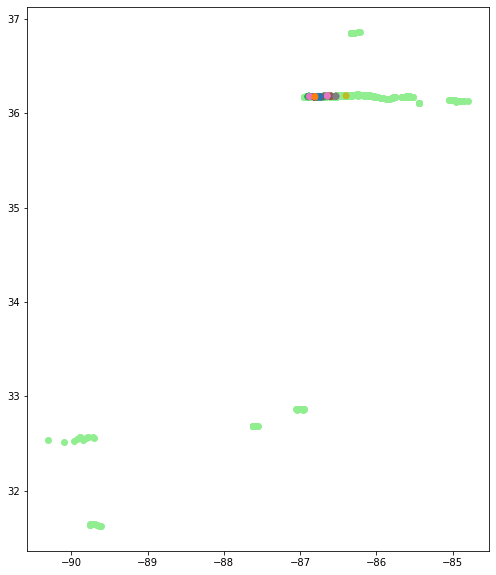

In [13]:
ax = damage_points.plot(figsize = (12, 10), color = 'lightgreen')
tornado_calls_path.plot( ax = ax, column = 'Cell_Tower_Address');

### Dataframe.geometry.to_crs('EPSG:4326')
- review (damage_points.crs)

In [ ]:
#derecho_calls.loc[0, 'geometry']
#tornado_calls.loc[0, 'geometry']
#derecho_dispatch.loc[0, 'geometry']
#tornado_dispatch.loc[0, 'geometry']

In [ ]:
#damage_points.loc[0, 'geometry']
#path_polygons.loc[0, 'geometry']
#tornado_paths.loc[0, 'geometry']

## Plotting 

In [ ]:
derecho_calls_geo.plot();

In [ ]:
tornado_calls_geo.plot()

In [ ]:
derecho_dispatch_geo.plot()

In [ ]:
tornado_dispatch_geo.plot()

In [ ]:
damage_points.plot();

In [ ]:
path_polygons.plot()

In [ ]:
tornado_paths.plot()

## Maps with legends plotted

In [ ]:
leg_kwds = {'title': 'Derecho Damage', 'loc': 'upper left', 'bbox_to_anchor': (1, 1.03), 'ncol': 1}

ax = damage_points.plot(figsize=(10, 10), color = 'white', edgecolor = 'black')
derecho_calls_geo.plot(ax = ax, column = 'Call_Type',  legend = True, legend_kwds = leg_kwds, cmap = 'Set3')
plt.show()

In [ ]:
leg_kwds = {'title': 'Tornado Damage', 'loc': 'upper left', 'bbox_to_anchor': (1, 1.03), 'ncol': 1}

ax = damage_points.plot(figsize=(10, 10), color = 'white', edgecolor = 'black')
tornado_calls_geo.plot(ax = ax, column = 'Call_Type',  legend = True, legend_kwds = leg_kwds, cmap = 'Set3')
plt.show()

In [ ]:
leg_kwds = {'title': 'Tornado Path', 'loc': 'upper left', 'bbox_to_anchor': (1, 1.03), 'ncol': 1}

ax = tornado_paths.plot(figsize=(10, 10), color = 'white', edgecolor = 'black')
derecho_calls_geo.plot(ax = ax, column = 'Call_Type',  legend = True, legend_kwds = leg_kwds, cmap = 'Dark2')
plt.show()

In [ ]:
leg_kwds = {'title': 'Damage', 'loc': 'upper left', 'bbox_to_anchor': (1, 1.03), 'ncol': 1}

damage_points.plot(column = 'efscale', figsize=(14, 10), edgecolor = 'black',
              legend = True, legend_kwds = leg_kwds, cmap = 'Set3')
plt.show()

In [ ]:
leg_kwds = {'title': 'Path', 'loc': 'upper left', 'bbox_to_anchor': (1, 1.03), 'ncol': 1}

path_polygons.plot(column = 'efscale', figsize=(14, 10), edgecolor = 'black',
              legend = True, legend_kwds = leg_kwds, cmap = 'Set3')
plt.show()

In [ ]:
leg_kwds = {'title': 'Tornado', 'loc': 'upper left', 'bbox_to_anchor': (1, 1.03), 'ncol': 1}

tornado_paths.plot(column = 'efscale', figsize=(14, 10), edgecolor = 'black',
              legend = True, legend_kwds = leg_kwds, cmap = 'Set3')
plt.show()

# Folium Maps

## Finding the Centerpoint of Nashville for the Folium Maps

In [14]:
nash_center = (36.174465, -86.767960)

## Creating the Initial Folium Map of Nashville

In [15]:
nash_map = folium.Map(location = nash_center, zoom_start = 12)

### Nashville Folium Map of the Damage Paths (path_polygons)

In [16]:
nashmapdamagepath_polygons = folium.Map(location = nash_center, zoom_start = 12)
   
folium.GeoJson(path_polygons).add_to(nashmapdamagepath_polygons)

In [17]:
nashmapdamagepath_polygons

## Nashville Folium Map of Damage Points

In [18]:
nashmapdamagepoints = folium.Map(location = nash_center, zoom_start = 12)
   
folium.GeoJson(damage_points).add_to(nashmapdamagepoints)

In [ ]:
nashmapdamagepoints

### Folium Map of the Damage Points overlay on the Damage Path (path_polygons)

In [19]:
nashmapdamagepoints_pathpolygon = folium.Map(location = nash_center, zoom_start = 12)

folium.GeoJson(damage_points).add_to(nashmapdamagepoints_pathpolygon)
folium.GeoJson(path_polygons).add_to(nashmapdamagepoints_pathpolygon)

nashmapdamagepoints_pathpolygon.save('../maps/nashmapdamagepoints_pathpolygon.html')

In [ ]:
nashmapdamagepoints_pathpolygon

## Folium map of Nashville of the tornado path with tornado dispatch overlay

In [20]:
nash_map_tornado = folium.Map(location = nash_center, zoom_start = 12)

folium.GeoJson(tornado_paths).add_to(nash_map_tornado)

#folium.GeoJson(path_polygons, style_function = lambda x: {'color': '#clcba2', 'fillcolor': '#clcba2'}).add_to(map_tornado)
#folium.GeoJson(path_polygons, style_function = lambda x: {'color':'#119617', 'fillColor': '#1119617'}).add_to(map_tornado)

for row_index, row_values in tornado_dispatch_geo.iterrows():
    loc = [row_values['lat'], row_values['lng']]
    pop = str(row_values['Location']), str(row_values['time'])
    icon = folium.Icon(color = 'red', icon = 'car', prefix ='fa')

    marker = folium.Marker(location = loc, popup = pop, icon = icon)
    marker.add_to(nash_map_tornado)

In [ ]:
nash_map_tornado

## Folium map of Nashville of the Tornado Path with tornado_calls overlay

In [21]:
nash_map_tornado_calls = folium.Map(location = nash_center, zoom_start = 12)

folium.GeoJson(tornado_paths).add_to(nash_map_tornado_calls)

for row_index, row_values in tornado_calls_geo.iterrows():
    loc = [row_values['lat'], row_values['lng']]
    pop = str(row_values['time'])
    icon = folium.Icon(color = 'red', icon = 'car', prefix ='fa')

    marker = folium.CircleMarker(location = loc, radius = 1, popup = pop, icon = icon)
    marker.add_to(nash_map_tornado_calls)

In [ ]:
nash_map_tornado_calls

## Folium Map of Nashville of Tornado Path with tornado_calls & tornado_dispatch

In [22]:
nash_map_tornado_call_dispatch = folium.Map(location = nash_center, zoom_start = 12)

folium.GeoJson(tornado_paths).add_to(nash_map_tornado_call_dispatch)

for row_index, row_values in tornado_dispatch_geo.iterrows():
    loc = [row_values['lat'], row_values['lng']]
    pop = str(row_values['Location']), str(row_values['time'])
    icon = folium.Icon(color = 'red', icon = 'car', prefix ='fa')

    marker = folium.Marker(location = loc, popup = pop, icon = icon)
    marker.add_to(nash_map_tornado_call_dispatch);


for row_index, row_values in tornado_calls_geo.iterrows():
    loc = [row_values['lat'], row_values['lng']]
    pop = str(row_values['time'])
    icon = folium.Icon(color = 'blue', icon = 'bus', prefix ='fa')

    marker = folium.CircleMarker(location = loc, popup = pop, icon = icon)
    
    marker.add_to(nash_map_tornado_call_dispatch)

In [ ]:
nash_map_tornado_call_dispatch

## Folium Map of the Damage Paths (path_polygons) with tornado_calls

In [23]:
nash_map_path_tornado_call = folium.Map(location = nash_center, zoom_start = 12)

folium.GeoJson(path_polygons).add_to(nash_map_path_tornado_call)

for row_index, row_values in tornado_calls_geo.iterrows():
    loc = [row_values['lat'], row_values['lng']]
    pop = str(row_values['time'])
    icon = folium.Icon(color = 'blue', icon = 'bus', prefix ='fa')

    marker = folium.Marker(location = loc, popup = pop, icon = icon)
    marker.add_to(nash_map_path_tornado_call)

In [ ]:
nash_map_path_tornado_call

## Folium Map of the Damage Paths (path_polygons) with tornado_dispatch

In [24]:
nash_map_path_tornado_dispatch = folium.Map(location = nash_center, zoom_start = 12)

folium.GeoJson(path_polygons).add_to(nash_map_path_tornado_dispatch)

for row_index, row_values in tornado_dispatch_geo.iterrows():
    loc = [row_values['lat'], row_values['lng']]
    pop = str(row_values['Location']), str(row_values['time'])
    icon = folium.Icon(color = 'red', icon = 'car', prefix ='fa')

    marker = folium.Marker(location = loc, popup = pop, icon = icon)
    marker.add_to(nash_map_path_tornado_dispatch)

In [ ]:
nash_map_path_tornado_dispatch

## Folium Map of Nashville with derecho_calls and derecho_dispatch

In [25]:
nash_map_derecho_call_dispatch = folium.Map(location = nash_center, zoom_start = 12)

for row_index, row_values in derecho_dispatch_geo.iterrows():
    loc = [row_values['lat'], row_values['lng']]
    pop = str(row_values['Location']), str(row_values['time'])
    icon = folium.Icon(color = 'red', icon = 'car', prefix ='fa')

    marker = folium.Marker(location = loc, popup = pop, icon = icon)
    marker.add_to(nash_map_derecho_call_dispatch);

for row_index, row_values in derecho_calls_geo.iterrows():
    loc = [row_values['lat'], row_values['lng']]
    pop = str(row_values['time'])
    icon = folium.Icon(color = 'blue', icon = 'bus', prefix ='fa')

    marker = folium.CircleMarker(location = loc, popup = pop, icon = icon)
    marker.add_to(nash_map_derecho_call_dispatch)

In [ ]:
nash_map_derecho_call_dispatch

## Reviewing the different damage types and quantities of each

In [26]:
damage_points.damage_txt.value_counts()

One- or Two-Family Residences (FR12)                                         2850
Small Barns or Farm Outbuildings (SBO)                                        412
Trees: Hardwood (TH)                                                          127
Trees: Softwood (TS)                                                          114
Apartments, Condos, Townhouses [3 stories or less] (ACT)                       90
Metal Building System (MBS)                                                    74
Warehouse Building [Tilt-up Walls or Heavy-Timber Construction] (WHB)          40
Small Retail Building [Fast Food Restaurants] (SRB)                            39
Low-Rise Building [1-4 Stories] (LRB)                                          36
Manufactured Home - Single Wide (MHSW)                                         35
Small Professional Building [Doctor's Office, Branch Banks] (SPB)              33
Institutional Building [Hospital, Government or University Building] (IB)      27
Electrical Trans

## Creating a dataframe of the damage details from the Tornado

### Residential

In [27]:
familyresidences = ['One- or Two-Family Residences (FR12)']
famres = damage_points.query('damage_txt in @familyresidences')

In [28]:
barnfarmbuildings = ['Small Barns or Farm Outbuildings (SBO)']
barnfarm = damage_points.query('damage_txt in @barnfarmbuildings')

In [29]:
threestorybuildings = ['Apartments, Condos, Townhouses [3 stories or less] (ACT)']
threestory = damage_points.query('damage_txt in @threestorybuildings')

### Commercial

In [30]:
metalbuildingsystem = ['Metal Building System (MBS)']
mbs = damage_points.query('damage_txt in @metalbuildingsystem')

In [31]:
warehousebuilding = ['Warehouse Building [Tilt-up Walls or Heavy-Timber Construction] (WHB)']
warehouse = damage_points.query('damage_txt in @warehousebuilding')

## Folium Map of Nashville with family residences overlay damage path

In [34]:
nash_map_tornado_dis_family = folium.Map(location = nash_center, zoom_start = 12)

style = {'fillColor': 'red', 'color': 'red'}
style2 = {'fillColor': 'yellow', 'color': 'yellow'}

#folium.GeoJson(path_polygons).add_to(nash_map_tornado_dis_family)
folium.GeoJson(nashville_tornado.geometry, style_function = lambda x:style).add_to(nash_map_tornado_dis_family)
folium.GeoJson(nashville_path.geometry, style_function = lambda x:style2).add_to(nash_map_tornado_dis_family)

for row_index, row_values in famres.iterrows():
    loc = [row_values['lat'], row_values['lng']]
    pop = str(row_values['damage_txt']), str(row_values['geometry'])
    icon = folium.Icon(color = 'red', icon = 'home', prefix ='fa')

    marker = folium.Marker(location = loc, radius = 2, weight = 2, popup = pop, icon = icon)
    marker.add_to(nash_map_tornado_dis_family)
    
nash_map_tornado_dis_family.save('../maps/nash_map_tornado_dis_family.html')
plt.savefig('nash_map_tornado_dis_family.png', dpi = 600)

<Figure size 432x288 with 0 Axes>

In [35]:
nash_map_tornado_dis_family

## Folium Map of Nashville with barns/farms overlay damage path

In [40]:
nash_map_tornado_dis_barnfarm = folium.Map(location = nash_center, zoom_start = 12)

style = {'fillColor': 'red', 'color': 'red'}
style2 = {'fillColor': 'yellow', 'color': 'yellow'}
#startloc = [36.1627, -86.7816]

#folium.GeoJson(path_polygons).add_to(nash_map_tornado_dis_barnfarm)
folium.GeoJson(nashville_tornado.geometry, style_function = lambda x:style).add_to(nash_map_tornado_dis_barnfarm)
folium.GeoJson(nashville_path.geometry, style_function = lambda x:style2).add_to(nash_map_tornado_dis_barnfarm)

for row_index, row_values in barnfarm.iterrows():
    loc = [row_values['lat'], row_values['lng']]
    pop = str(row_values['damage_txt']), str(row_values['geometry'])
    icon = folium.Icon(color = 'blue', icon = 'industry', prefix ='fa')

    marker = folium.Marker(location = loc, radius = 2, weight = 2, popup = pop, icon = icon)
    marker.add_to(nash_map_tornado_dis_barnfarm)
    
nash_map_tornado_dis_barnfarm.save('../maps/nash_map_tornado_dis_barnfarm.html')
plt.savefig('nash_map_tornado_dis_barnfarm.png', dpi = 600)

<Figure size 432x288 with 0 Axes>

In [41]:
nash_map_tornado_dis_barnfarm

## Mapping the damage_points damage_txt in lists 

In [42]:
Other = damage_points.loc[damage_points.damage_txt == 'Other (O)']

Trees = damage_points.loc[(damage_points.damage_txt == 'Trees: Hardwood (TH)')
                              |(damage_points.damage_txt == 'Trees: Softwood (TS)')]

Residential = damage_points.loc[(damage_points.damage_txt == 'One- or Two-Family Residences (FR12)')
                              |(damage_points.damage_txt == 'Small Barns or Farm Outbuildings (SBO)')  
                              |(damage_points.damage_txt == 'Masonry Apartment or Motel Building (MAM)')
                              |(damage_points.damage_txt == 'Manufactured Home - Single Wide (MHSW)')
                              |(damage_points.damage_txt == 'Apartments, Condos, Townhouses [3 stories or less] (ACT)')
                              |(damage_points.damage_txt == 'Manufactured Home - Double Wide (MHDW)')
                              |(damage_points.damage_txt == 'Motel (M)')]

Commercial = damage_points.loc[(damage_points.damage_txt == 'Metal Building System (MBS)')
                              |(damage_points.damage_txt == 'Low-Rise Building [1-4 Stories] (LRB)')
                              |(damage_points.damage_txt == 'Electrical Transmission Lines (ETL)')
                              |(damage_points.damage_txt == 'Small Professional Building [Doctors Office, Branch Banks] (SPB)')
                              |(damage_points.damage_txt == 'Institutional Building [Hospital, Government or University Building] (IB)')
                              |(damage_points.damage_txt == 'Large, Isolated Retail Building [K-Mart, Wal-Mart] (LIRB)')                    
                              |(damage_points.damage_txt == 'Junior or Senior High School (JHSH)')                      
                              |(damage_points.damage_txt == 'Strip Mall (SM)') 
                              |(damage_points.damage_txt == 'Elementary School [Single Story; Interior or Exterior Hallways] (ES)') 
                              |(damage_points.damage_txt == 'Mid-Rise Building [5-20 Stories] (MRB)')  
                              |(damage_points.damage_txt == 'Free-Standing Towers (FST)' )
                              |(damage_points.damage_txt == 'Service Station Canopy (SSC)') 
                              |(damage_points.damage_txt == 'Small Retail Building [Fast Food Restaurants] (SRB)')]

## The Nashville Tornado Damage with Residential & Commercial Overlay

In [43]:
style = {'fillColor': 'red', 'color': 'red'}
style2 = {'fillColor': 'yellow', 'color': 'yellow'}

#mapping tornado path

map_damage = folium.Map(location = nash_center, zoom_start = 12)

folium.GeoJson(nashville_tornado.geometry, style_function = lambda x:style).add_to(map_damage)
folium.GeoJson(nashville_path.geometry, style_function = lambda x:style2).add_to(map_damage)

#mapping residential damage points

for row_index, row_values in Residential.iterrows():
    loc = [row_values['lat'], row_values['lng']]
    pop = [row_values['dod_txt']]
    icon = folium.Icon(color = 'red', icon = 'home', prefix = 'fa')
    marker = folium.Marker(location = loc, popup = pop, icon = icon)
    marker.add_to(map_damage)

#mapping commercial damage points    
    
for row_index, row_values in Commercial.iterrows():
     loc = [row_values['lat'], row_values['lng']]
     pop = [row_values['dod_txt']]
     icon = folium.Icon(color = 'blue', icon = 'industry', prefix = 'fa')
     marker = folium.Marker(location = loc, popup = pop, icon = icon)
     marker.add_to(map_damage)

map_damage.save('../maps/map_damage.html')
plt.savefig('map_damage.png', dpi = 600)

<Figure size 432x288 with 0 Axes>

In [44]:
map_damage

## The Nashville Tornado Damage with Trees & Other - ? Overlay

In [48]:
style = {'fillColor': 'red', 'color': 'red'}
style2 = {'fillColor': 'yellow', 'color': 'yellow'}

#mapping tornado path

map_damage_trees = folium.Map(location = nash_center, zoom_start = 12)

folium.GeoJson(nashville_tornado.geometry, style_function = lambda x:style).add_to(map_damage_trees)
folium.GeoJson(nashville_path.geometry, style_function = lambda x:style2).add_to(map_damage_trees)
    
#mapping tree damage points
    
for row_index, row_values in Trees.iterrows():
    loc = [row_values['lat'], row_values['lng']]
    pop = [row_values['dod_txt']]
    icon = folium.Icon(color = 'darkgreen', icon = 'tree', prefix = 'fa')
    marker = folium.Marker(location = loc, popup = pop, icon = icon)
    marker.add_to(map_damage_trees)

#mapping other/unknown damage points
    
#for row_index, row_values in Other.iterrows():
   # loc = [row_values['lat'], row_values['lng']]
   # pop = [row_values['dod_txt']]
   # icon = folium.Icon(color = 'gray', icon = 'question', prefix = 'fa')
    #marker = folium.Marker(location = loc, popup = pop, icon = icon)
   # marker.add_to(map_damage_trees)
    
map_damage_trees.save('../maps/map_damage_trees.html')
plt.savefig('../maps/map_damage_trees.png', dpi = 600)

<Figure size 432x288 with 0 Axes>

In [49]:
map_damage_trees

## Creating a dictionary between residential vs commercial

In [ ]:
#structure = ['residential', 'residential', 'trees', 'trees', 'residential', 'commercial', 'commercial', 
            # 'commercial', 'commercial', 'residential', 'commercial', 'commercial']

#description = ['One- or Two-Family Residences (FR12)', 'Small Barns or Farm Outbuildings (SBO)',
              # 'Apartments, Condos, Townhouses [3 stories or less] (ACT)', 'Metal Building System (MBS)',
               #'Warehouse Building [Tilt-up Walls or Heavy-Timber Construction] (WHB)', 
               #'Small Retail Building [Fast Food Restaurants] (SRB)', 'Low-Rise Building [1-4 Stories] (LRB)', 
               #'Manufactured Home - Single Wide (MHSW)', "Small Professional Building [Doctor's Office, Branch Banks] (SPB)", 
               #'Institutional Building [Hospital, Government or University Building] (IB)']

In [ ]:
#structure_damage = {'One- or Two-Family Residences (FR12)':'residential', 'Small Barns or Farm Outbuildings (SBO)':'residential', 
                   # 'Trees: Hardwood (TH)':'trees', 'Trees: Softwood (TS)':'trees' 'Apartments, Condos, Townhouses [3 stories or less] (ACT)':'residential', 'Metal Building System (MBS)':'commercial',
              # 'Warehouse Building [Tilt-up Walls or Heavy-Timber Construction] (WHB)':'commercial', 
              # 'Small Retail Building [Fast Food Restaurants] (SRB)':'commercial', 'Low-Rise Building [1-4 Stories] (LRB)':'commercial', 
               #'Manufactured Home - Single Wide (MHSW)':'residential', "Small Professional Building [Doctor's Office, Branch Banks] (SPB)":"commercial", 
               #'Institutional Building [Hospital, Government or University Building] (IB)':'commercial'} 

In [ ]:
#residential_damage = {'One- or Two-Family Residences (FR12)':'residential', 'Small Barns or Farm Outbuildings (SBO)':'residential', 
                     #'Apartments, Condos, Townhouses [3 stories or less] (ACT)':'residential', 
                     #'Manufactured Home - Single Wide (MHSW)':'residential'} 

In [ ]:
#commercial_damage = {'Metal Building System (MBS)':'commercial', 'Warehouse Building [Tilt-up Walls or Heavy-Timber Construction] (WHB)':'commercial', 
               #'Small Retail Building [Fast Food Restaurants] (SRB)':'commercial', 'Low-Rise Building [1-4 Stories] (LRB)':'commercial', 
              #"Small Professional Building [Doctor's Office, Branch Banks] (SPB)":"commercial", 
               #'Institutional Building [Hospital, Government or University Building] (IB)':'commercial'}

In [ ]:
#Keep for dictionary
##for i, row in damage_points.iterrows():

    #if structure_damage[row.damage_txt] in ['residential', 'commercial']:

       # damage_points.structure_type = damage_points.damage_txt.apply (lambda x:structure_damage[x])
        
    #else:
       #pass

### How many damage points for the tornado

In [ ]:
damage_points.stormdate.value_counts()

In [ ]:
damage_points.efscale.value_counts()

In [ ]:
damage_points.windspeed.value_counts().sort_values(ascending=False)

## Histograms

In [ ]:
plt.figure(figsize = (20, 10))
plt.hist(derecho_calls_geo.time, bins = 479); #479 is the number of minutes from the first to last call of this dataset

In [ ]:
plt.figure(figsize = (20, 10))
plt.hist(tornado_calls_geo.time, bins = 254); #254 is the number of minutes from the first to last call of this dataset.

## Heatmapping

In [ ]:
# Heatmapping points to be used and placed in new dataframe.
#damage_points['lng'] = damage_points.geometry.y
#damage_points['lng'] = damage_points.geometry.x
#damage_points_lat_lng = damage_points[['lng','lat']]

### Breaking down the dataframes by time

In [ ]:
tornado_calls['count'] = 1
tornado_calls['minute'] = tornado_calls['time'].dt.minute
torn_count = pd.DataFrame(
            tornado_calls.groupby(['Cell_Tower_Address', 'lat', 'lng'])\
            ['count'].sum().sort_values(ascending = False))

tornado_list = torn_count.groupby(
            ['lat', 'lng'])\
            .sum().reset_index().values.tolist()

In [ ]:
torn_minute_list = []

for minute in tornado_calls['minute'].sort_values().unique():
    torn_minute_list.append(tornado_calls.loc[tornado_calls['minute'] == minute,
    ['lat', 'lng', 'count']]\
    .groupby(['lat', 'lng'])\
    .sum().reset_index().values.tolist())
                          
torn_minute_list

## Heatmapping w time

In [ ]:
style = {'fillColor': 'red', 'color': 'red'}
style2 = {'fillColor': 'aqua', 'color': 'aqua'}

map_heat = folium.Map(location = nash_center, zoom_start = 10)

folium.GeoJson(nashville_tornado.geometry, style_function = lambda x:style).add_to(map_heat)
folium.GeoJson(nashville_path.geometry, style_function = lambda x:style2).add_to(map_heat)

HeatMapWithTime(torn_minute_list, radius=20, auto_play=True, position='bottomright',
                name="cluster", max_opacity=0.7).add_to(map_heat)

In [ ]:
map_heat

In [ ]:
style = {'fillColor': 'red', 'color': 'red'}
style2 = {'fillColor': 'aqua', 'color': 'aqua'}

map_heat_2 = folium.Map(location = nash_center, zoom_start = 10)

folium.GeoJson(nashville_tornado.geometry, style_function = lambda x:style).add_to(map_heat_2)
folium.GeoJson(nashville_path.geometry, style_function = lambda x:style2).add_to(map_heat_2)

start = datetime.datetime(2020, 3, 3, 0)
end = datetime.datetime(2020, 3, 3, 6)
daterange = pd.date_range(start = start, end = end, periods = 24)

time_index = [d.strftime('%I:%M %p') for d in daterange]

HeatMapWithTime(torn_minute_list, radius = 30,
               gradient={0.1: 'blue', 0.5: 'lime', 0.75: 'orange', 1: 'red'}, 
                min_opacity=0.4, 
                max_opacity=0.8, 
                use_local_extrema=True)\
                .add_to(map_heat_2)

In [ ]:
map_heat_2

In [ ]:
##Keep from Tom

stormPalette = {'T': 'green',
               'D': 'magenta',
               'P': 'yellow'}
stormPalette